# Kerr nonlinearities

Li-Xun Cai  
2025-05-17

Inspirations taken from [this QuTiP
tutorial](https://nbviewer.org/urls/qutip.org/qutip-tutorials/tutorials-v5/lectures/Lecture-14-Kerr-nonlinearities.ipynb)
by J. R. Johansson.

This tutorial demonstrates the use of

-   [`plot_wigner`](https://qutip.org/QuantumToolbox.jl/stable/resources/api#QuantumToolbox.plot_wigner)
-   [`wigner`](https://qutip.org/QuantumToolbox.jl/stable/resources/api#QuantumToolbox.wigner)

by exploring Kerr nonlinearities.

## Introduction

Kerr nonlinearities arise from the interaction between the
electromagnetic field and a nonlinear medium with a significant
third-order susceptibility, $\chi^{(3)}$. Since experiments typically
use monochromatic light sources such as lasers, we restrict our
discussion to a single electromagnetic mode.

To derive the Hamiltonian, we start by reviewing the classical theory:

1.  **Nonlinear polarization density:**  
    In a nonlinear medium, the $i$-th component of the polarization
    density $\vec{\mathcal{P}}$ is given by $$
    \mathcal{P}_i = 
     \sum_j \chi^{(1)}_{ij} E_j + 
     \sum_{jk} \chi^{(2)}_{ijk} E_j E_k + 
     \sum_{jkl} \chi^{(3)}_{ijkl} E_j E_k E_l + \dots  
    $$ for $i,j,k,l \in \{x,y,z\}$, where ${\chi}^{(m)}$ is the $m$-th
    order nonlinear susceptibility and $E$ is the electric field. By the
    assumption that only the first and third order terms are
    non-vanishing for our Kerr medium in the single light mode, we can
    approximate the polarization density as $$
    \mathcal{P} \simeq
     \chi^{(1)} E + 
     \chi^{(3)} E^3
    $$ with the subscripts for spatial components dropped.
2.  **Interaction of the Electric Field with the Polarization
    Density:**  
    The interaction energy is proportional to $\mathcal{P} \cdot E$. The
    nonlinear term in the Hamiltonian is therefore $$
    H_{\text{NL}} = \chi E^4 
    $$ where $\chi$ is the effective coefficient primarily determined by
    the nonlinear susceptibility.
3.  **Quantization of the Electromagnetic Mode:**  
    In quantum optics, the electric field operator for a single mode is
    proportional to the quardrature operator
    $\hat{x} = \frac{(\hat{a} + \hat{a}^\dagger)}{2}$ where $\hat{a}$ is
    the annihilation operator.

We then combine the above properties, expand
$(\hat{a}^\dagger + \hat{a})^4$, drop the terms that do not conserve the
photon number or irrelevant to this tutorial with [rotating wave
approximation
(RWA)](https://en.wikipedia.org/wiki/Rotating-wave-approximation), and
put the remaining terms in normal order. Finally, we arrive at the
effective Hamiltonian $$
H = \frac{\chi}{2} (\hat{a}^\dagger)^2 \hat{a}^2,
$$ where $\chi$ again absorbed the coefficients.

## Code demonstration

In [1]:
using QuantumToolbox
using CairoMakie

We begin by defining functions for visualization:

1.  `plot_variance` plots the expectation value of an operator `op` and
    shades the variance.
2.  `plot_Fock_dist` plots the dynamics of the Fock distribution.

In [1]:
function plot_variance(op, tlist, states)
    e = real.(expect(op, states))
    v = real.(variance(op, states))
    
    fig = Figure()
    ax = Axis(fig[1,1])
    lines!(ax, tlist, e)
    band!(ax, tlist, e .- v, e .+ v, alpha = 0.3)
    return fig, ax
end

function plot_Fock_dist(tlist, states)
    fig = Figure()
    ax = Axis(
        fig[1,1],
        xlabel = L"N",
        ylabel = L"t"
    )

    n_col = prod(states[1].dims)
    n_row = length(tlist)

    data = zeros(Float64, n_row, n_col)

    for (idx, state) in enumerate(states)
        data[idx, :] = real.(diag(state))
    end

    hm = heatmap!(
        ax, 
        0:(n_col-1), 
        tlist, 
        data', 
        colormap = cgrad([:white, :magenta]),
        colorrange = (0,1)
    )
    Colorbar(fig[1,2], hm, label = "Probability")

    
    return fig, ax
end

plot_Fock_dist (generic function with 1 method)

Next, we define the system parameters and operators.

In [1]:
N = 15 # Dimension of the Hilbert space
χ = 1  # effective susceptibility

a = destroy(N) # annihilation operator
n = num(N)     # number operator

# quadrature operators
x =  a + a'    
p = -1 * im * (a - a')

# Hamiltonian
H = 0.5 * χ * a' * a' * a * a


Quantum Object:   type=Operator()   dims=[15]   size=(15, 15)   ishermitian=true
15×15 SparseArrays.SparseMatrixCSC{ComplexF64, Int64} with 13 stored entries:
     ⋅          ⋅          ⋅      …       ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅      1.0+0.0im          ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅      …       ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅      …       ⋅           ⋅           ⋅    
     ⋅          ⋅          ⋅              ⋅     

Since we are considering unitary dynamics, i.e., no dissipation, the
dynamics are fully captured for $\chi t \in \left[0, 2 \pi \right]$, and
the coherent initial state is representative for a laser light source.

Note that if the keyword argument `e_ops` is not supplied to
[`mesolve`](https://qutip.org/QuantumToolbox.jl/stable/resources/api#QuantumToolbox.sesolve),
the returned `result` contains the state at each time point at field
`states`. Consult the [user guide to
`TimeEvolutionSol`](https://qutip.org/QuantumToolbox.jl/stable/users_guide/time_evolution/solution)
for more details.

In [1]:
ρ0 = coherent_dm(N, 2.0)
tlist = 0:0.01:(2*π / χ)

result = mesolve(H, ρ0, tlist)

Progress: [==============================] 100.0% --- Elapsed Time: 0h 00m 00s (ETA: 0h 00m 00s)

Solution of time evolution
(return code: Success)
--------------------------
num_states = 629
num_expect = 0
ODE alg.: OrdinaryDiffEqTsit5.Tsit5{typeof(OrdinaryDiffEqCore.trivial_limiter!), typeof(OrdinaryDiffEqCore.trivial_limiter!), Static.False}(OrdinaryDiffEqCore.trivial_limiter!, OrdinaryDiffEqCore.trivial_limiter!, static(false))
abstol = 1.0e-8
reltol = 1.0e-6

We first check the expectation value dynamics of the number operator `n`
with the two visualization functions we defined previously.

In [1]:
fig1, ax1 = plot_variance(n, tlist, result.states)
ax1.title = L"N"
display(fig1)

fig2, ax2 = plot_Fock_dist(tlist, result.states)
display(fig2)

<img width=672 height=480 style='object-fit: contain; height: auto;' src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAqAAAAHgCAYAAAB6jN80AAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAgY0hSTQAAeiYAAICEAAD6AAAAgOgAAHUwAADqYAAAOpgAABdwnLpRPAAAAAlwSFlzAAAOxAAADsQBlSsOGwAAH6JJREFUeAHtwQuQHmRhL+7ffvvuZt3NZhOyROSyFCgD0qJEQdIxMZWLERSUeiEyIhodUZEGpSPWKi7KVWVsy9DKILR0vIDt1GLBayQoYQr0gggjFCVKxEBDEpJsNsnevv2fHYc5Oalt/3N2v9eDeZ6nTP4vAQCASkoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAJhR9957b2666aY8/fTTufnmm9Pe3p4pV199db773e9m4cKF+djHPpaurq4A7I1KAJhRxx9/fL7zne/ka1/7Wr73ve/lhBNOyJQLL7wwjz32WC677LIA7M1KAJhxzWYzZ555Zm6++eaccMIJmfL4449n8eLFAdjblQAwo3bu3JnnPe95OeWUU/LqV7861157bTo6OnLXXXdl6dKlAdjblQAwo+69994cf/zxOe644zJ37tysWrUqp5xySn72s5/lrW99awD2diUAzKj77rsvf/iHf5gpy5cvz80335xTTjklk5OTASApAWBGjYyMpKurK1OWL1+exYsX54knnsi+++4bAJISAGbMxMRE2tvb86yjjz46Bx54YD7ykY/kQx/6UABISgCYMffff39e9KIXZXfLly/PZz/72dx0000BICkBYEY89NBD+dCHPpTTTjstY2Nj6ejoyJTly5fn3nvvTVtbWwBISgCYEaOjo7nssssyPj6eZrOZZx1++OG58cYbA8AvlQAwI17ykpfkv7JgwYIA8EslAABQUQkAAFRUAgAAFZUAAEBFJb9mf/EXf5EHH3wwv/VbvxUAAP7f9rOf/SxHH3103ve+9+X/Vsmv2T333JO1a9emr68vNUxMTGTXrl3p6ekJrbVt27bMmTMntNbw8HC6urrS3t4eWmfnzp0ppaSjoyO0zujoaJrNZrq6ukLrjI+PZ3R0NN3d3aF1Jicns3379vT29uY3yYMPPpjh4eG8733vy/+tkl+zQw89NIceemgGBwdTw+joaDZv3pz99tsvtNa6desyMDAQWuupp57KPvvsk87OztA6mzZtSldXV3p6ekLrDA0NZXx8PPPmzQuts2vXrmzbti0LFiwIrdNsNrN+/foceOCB+U0yODiY6SoBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioZAZs3rw5q1evzsjISBYvXpyBgYEAAMCvUjJN//zP/5xXv/rVmTNnTvr6+rJixYrceOONOeusswIAAHsqmaY//uM/zpIlS/IP//APmfLxj388K1euzFlnnRUAANhTyTRt3rw5L3/5y/OsY445JkNDQxkdHU1nZ2cAAGB3JdN03nnn5aMf/Whe8IIXZO7cubnsssty7rnnprOzMwAAsKeSaTr99NNz9dVX56Mf/Wi6uroyPDyc9773vflVBgcHc8kll2R3S5cuzcKFC7Nu3brUMDY2lqc3P5NtO3aF1nryySeza7wZWmvjxo3ZtHUoHR0doXW2bNmSzs7OdHd3h9YZHh7OxMRE5jyzNbTOyMhIhoeHs2X7jtA6zWYzGzZsyI7R8bRSe6MtHY221LJ169b09fVlOkqmaenSpXn961+fSy+9NI1GI1/60pfyspe9LGvXrk1/f392Nzg4mMHBwexucHAwUwYGBlLD6Oho0tGVef37htbaNd5M/377h9ZqNkrmzp2bzs7O0DqNzq50dXWlu7s7tE7X9u0ZHx/P3LlzQ+uMjIxk1tBQ+vv7Q+s0m82Mp5H+/fZPK3W2NzJ7VkktfX19ma6Safj3f//3PPzww1mzZk0ajUamnHXWWfnwhz+cO+64I29+85sDAAC7K5mG+fPnZ8qjjz6aRYsWZcqmTZuycePG9Pf3BwAA9lQyDf39/TnvvPPyhje8Ie9///vT1dWVG264Iccdd1yWLl0aAADYU8k0XXPNNVm8eHG++c1vZmRkJO9+97tz7rnnpr29PQAAsKeSaWpra8vy5cuzfPnyAADA/6QEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqAQCAikoAAKCiEgAAqKgEAAAqKgEAgIpKAACgohIAAKioBAAAKioBAICKSgAAoKISAACoqAQAACoqmQHf//73c9VVV+Xhhx/Osccem6uvvjoHHXRQAABgTyXT9C//8i957Wtfm8HBwVxwwQW54oor8oY3vCH33XdfAABgTyXTdPXVV2fFihX54Ac/mCmHH354/uiP/igbN25Mf39/AABgdyXTdNttt+XWW2/N+Ph41q9fn4GBgfzd3/1dAADgVymZhq1bt2b79u355je/mdNPPz3j4+Pp7e3Nddddlz/4gz/InlatWpVVq1Zld+vXr8/++++fLVu2pIbR0dEMDQ2l0dEZWmtoaChbt24NrTU0NJRGo5GOjo7QOtu2bcvo6GjGxsZC6wwPD2d8fDxtbW2hdUZHRzM0NJSOjo7QOs1mM0NDQ9m6dWtaqbO9kfHO9tSya9eudHV1ZTpKpmHTpk2Zcu+992bt2rXp7+/PNddck7PPPjuLFi3K/vvvn911dXVl3rx52d2GDRvS1taWRqORGhqNRtra2tJoNEJrNRqNNBqN0FptbW1pa2tLo9EIrdNoNNJoNNJoNELrNBqNNBqNNBqN0DptbW1pa2tLo9EIrdVoNNJoNNJKjUYjjUYjtbS1tWW6SqZh/vz5mTI4OJgFCxZkysqVK3P55Zfn+9//fpYvX57dLV68OIsXL87uBgcHM2XOnDmpYXR0NFt3jKS3tze0Vk9PT3p7e0Nr7dy5M729vens7AytMzY2lq6urnR3d4fWaWtry/j4eHp7e0PrdHZ2Zkpvb29onWazmeHh4fT29qaVOtsbmT2rpJZZs2Zlukqmoa+vL/Pnz8/4+Hj2NGvWrAAAwJ5Kpunss8/OJz7xiRx77LGZN29ePvOZz2RsbCyveMUrAgAAeyqZpksuuSRnnnlmnv/856e7uzvd3d35yle+kvnz5wcAAPZUMk1z5szJN77xjWzcuDGbNm3Kb//2b6e9vT0AAPCrlMyQ/v7+9Pf3BwAA/jslAABQUQkAAFRUAgAAFZUAAEBFJQAAUFEJAABUVAIAABWVAABARSUAAFBRCQAAVFQCAAAVlQAAQEUlAABQUQkAAFRUAgAAFZUAAEBFJQAAUFEJAABUVAIAABWVAABARSUAAFBRCQAAVFQCAAAVlQAAQEUlAABQUQkAAFRUAgAAFZUAAEBFJQAAUFEJAABUVAIAABWVAABARSUAAFBRCQAAVFQCAAAVlQA

<img width=672 height=480 style='object-fit: contain; height: auto;' src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAqAAAAHgCAYAAAB6jN80AAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAgY0hSTQAAeiYAAICEAAD6AAAAgOgAAHUwAADqYAAAOpgAABdwnLpRPAAAAAlwSFlzAAAOxAAADsQBlSsOGwAAIABJREFUeAHtwQmY1mWh+P3vDfcwMAyxyqDIIi4Dguw6iBAomKGiiCFGBYKZCSSkEHQ0z3SpKBgpkvtyFHE5arYocRJENPUgSViIZiAolwuaOYSKM2zzPtP/5X/N6+vpPMv49GP8fj6xOgVJkiQpTyKSJElSHkUkSZKkPIpIkiRJeRSRJEmS8igiSZIk5VFEkiRJyqOIJEmSlEcRSZIkKY8ikiRJUh5FJEmSpDyKSJIkKbHefPNNRo8ezerVq/lntm7dyvTp03nhhRc4/PDDmTNnDn369CGJIpIkSUqc6upq/vKXv3DxxRfzwQcf8M/s3buXE044ga5du3LnnXfyy1/+kuOPP55XX32VkpISkiYiSZKkxJk9eza33HILO3fu5KCDDuKfWbZsGW+88QYvvPACRUVFfPnLX+aJJ57gnnvuYcaMGSRNRJIkSYkzd+5c5s6dy1133cUVV1zBP/Pcc88xYMAAioqK2GfYsGE8++yzzJgxg6SJ1CM33ngj69ato3PnzkiSJP1PXn/9dY466igmT55MLlauXMnKlSvJROvWrdmxYwe1HXfccQwaNIhsbd26lbZt21Jb27ZtWbVqFUkUqUdWrVrFptc20bxZcxKhiuSoJDl2os8SSY5GJEcjkqMhydGQ5AhI+51169bx8ccfM3nyZHKxcuVKVv54JUMZSjpWspKO3+rIQQcdRG2VlZXkYufOnRQUFFBbQUEBn3zyCUkUqUe6dOlCl85dKP9ROYmwneT4gOT4EH2WIpKjGclRTHIUkhwFJEcDkiMgpaW8vJy6MpShlIdy0lFeXQ5doLy8nLpUUlLC+vXrqa2iooJ27dqRRBFJkiTt17p168a9995LbWvXrqW0tJQkikiSJCl7AQjk1a5du1iwYAHDhw+nd+/enHnmmUydOpX77ruPcePG8Yc//IEnnniCK6+8kiSKSJIkab9SVVXFzJkzWbhwIb1796a4uJiHH36YsWPHcumll7J161auueYaevfuTRJFJEmSlJtAeqrJ2DnnnMM555xDbcXFxVRXV1PbSSedxPvvv8+GDRvo3LkzTZo0IakikiRJyl4AAukJfK5ijHTr1o2ki0iSJEl5FJEkSVJuAspARJIkScqjiCRJkrIXgEB6AkqJSJIkSXkUkSRJUm4CykAkYfbs2cMf/vAHXnnlFfr27UuPHj2QJElKrAAE0hNQSiRBqqqqOOuss3jhhRfo3Lkzzz//PPPnz2fatGlIkiQlVkAZiCTIz372M9544w1effVViouLufvuu/nud7/Lt7/9bZo2bYokSZL2f5EEueOOO5gxYwbFxcXU+Na3vkW/fv1o2LAhkiRJiRSAQHoCSokkxO7du3n11Vc55JBDmDNnDhs3bqR3796cf/75FBYWIkmSlFgBZSCSEO+++y579+7l3HPPZcSIERx22GHcdNNNPPLIIzz55JOEEKitvLycH//4x9Q2ZMgQhn55KJIkSUquSMJMnz6dCy+8kBqTJk2iU6dOPP300wwZMoTaysvLKS8vp7by8nLYiyRJUv4EIJCegFIiCVFSUkKDBg0oKytjn3bt2tG+fXtef/11hgwZgiRJkvZ/kYSIMTJw4ECeeeYZysrKqPHWW2/x5ptv0q1bNyRJkhIroAxEEuSSSy5hzJgxvPPOO7Rv356bb76ZU045hWOOOQZJkiTVD5EE+epXv8rSpUu5//77Wb16NdOnT+c73/kOkiRJiRWAQHoCSokkzKBBgxg0aBCSJEn7jYAyEJEkSVL2AhBIT0ApEUmSJCmPIpIkScpNQBmISJIkSXkUkSRJUvYCEEhPQCkRSZIkKY8ikiRJyk1AGYhIkiQpewEIpCeglIgkSZKURxFJkiTlJqAMRCRJkpS9AATSE1BKRJIkScqjiCRJknITUAYikiRJUh5FJEmSlL0ABNITUEpEkiRJyqOIJEmSchNQBiKSJEnKXgAC6QkoJSJJkqTcBJSBiCRJkpRHEUmSJGUvAIH0BJQSkSRJUm4CykBEkiRJ2QtAID0BpUQkSZKkPIpIkiQpNwFlICJJkiTlUUSSJEnZC0AgPQGlRCRJkqQ8ikiSJCk3AWUgIkmSpOwFIJCegFIikiRJUh5FJEmSlJuAMhCRJEmS8igiSZKk7AUgkJ6AUiKSJElSHkUkSZKUm4AyEJEkSVL2AhBIT0ApEUmSJOUmoAxEJEmSpDyKSJIkKXsBCKQnoJSIJEmSchNQBiKSJElSHkUkSZKUvQAE0hNQSkSSJEm5CSgDEUmSJCmPIpIkScpeAALpCSglIkmSJOVRRJIkSbkJKAMRSZIkZS8AgfQElBKRJEmS8igiSZKk3ASUgYgkSZKyF4BAegJKiUiSJEl5FEmQDz/8kPXr11Nbo0aN6Nu3L5IkSYkVUAYiCbJs2TLOPPNMaispKWHr1q1IkiSpfogkyIYNGzj11FN59NFHkSRJ2i8EIJCegFIiCfLaa69RWlpKjerqakIISJIkqX6JJMiGDRuorKykpKSE7du3M2DAAK6//nqOOuooPq2iooKKigpqq6yspHGjxkiSJOVVQBmIJMjrr79Or169uOOOO4gxcumll3LyySfzyiuvUFxcTG2LFi3i+uuvp7YjjjiCsqPLkCRJypsABNITUEokQTZv3kxtd911F23atOGpp57ilFNOobZp06Yxbdo0aisvL4e9SJIk5VdAGYgkxJ49e6isrKRp06bsU1RURElJCR988AGSJEmqHyIJ8f7779O+fXuWLFnCSSedRI0tW7bw5ptv0qdPHyRJklQ/RBKipKSE8847jwkTJnDOOefQunVrbr75Zs455xx69OiBJElSIgUgkJ6AUiIJsnDhQvr27cuKFSt4++23KS8v55vf/CaSJEmqPyIJEmPkvPPO47zzzkOSJGm/EVAGIpIkScpeAALpCSglIkmSpNwElIGIJEmSlEcRSZIkZS8AgfQElBKRJElSbgLKQESSJEnZC0AgPQGlRCRJkqQ8ikiSJCk3AWUgIkmSJOVRRJIkSdkLQCA9AaVEJEmSpDyKSJIkKTcBZSAiSZKk7AUgkJ6AUiKSJElSHkUkSZKUm4AyEJEkSVL2AhBIT0ApEUmSJCmPIpIkScpNQBmISJIkSXkUkSRJUvYCEEhPQCkRSZIkKY8ikiRJyk1AGYhIkiQpewEIpCeglIgkSZJyE1AGIpIkSVIeRSRJkpS9AATSE1BKRJIkScqjiCRJknITUAYikiRJUh5FJEmSlL0ABNITUEpEkiRJuQkoAxFJkiQpjyKSJEnKXgAC6QkoJSJJkqTcBJSBiCRJkrIXgEB6AkqJSJIkSXkUkSRJUm4CykBEkiRJyqOIJEmSsheAQHoCSolIkiRJeRSRJElSbgLKQESSJEnZC0AgPQGlRCRJkqQ8ikiSJCk3AWUgIkmSpOwFIJCegFIikiRJUh5FJEmSlJuAMhCRJEmS8igiSZKk7AUgkJ6AUiKSJEnKTUAZiEiSJEl5FJEkSVL2AhBIT0ApEUmSJOUmoAxEEuqvf/0r3/ve97jzzjspKipCkiRJ9UMkoSZNmsRjjz3GzTffTFFREZIkSYkUgEB6AkqJJNDChQtZt24dkiRJqn8iCbNu3TrmzJnDHXfcwSmnnIIkSVLiBZSBSIJUVlby9a9/neuuu46OHTvyz2zatIlNmzZRW0VFBS2bt0SSJEnJFUmQiy++mKOPPpqxY8fy0ksv8c8888wz3HPPPdRWXFxMy6NaIkmSlDc

CairoMakie.Screen{IMAGE}

As expected, the photon number is conserved throughout. Either the
expectation value or the Fock distribution are conserved in the
nonlinear interaction.

We now turn to the quadrature operators. The expectation value dynamics
of `x` and `p` are plotted below.

In [1]:
titles = [L"x", L"p"]
for (idx, op) in enumerate([x, p])
    _fig, _ax = plot_variance(op, tlist, result.states)
    _ax.title = titles[idx]
    display(_fig)
end

<img width=672 height=480 style='object-fit: contain; height: auto;' src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAqAAAAHgCAYAAAB6jN80AAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAgY0hSTQAAeiYAAICEAAD6AAAAgOgAAHUwAADqYAAAOpgAABdwnLpRPAAAAAlwSFlzAAAOxAAADsQBlSsOGwAAIABJREFUeAHswQuYnGd93/3v/Tz3zOyudnWwJEuWbNnyQRYCG3wgGOPYAWyDOYScSpuUvtAQG3AuglN4cfM2cZWUNtC0SUpiAkloiMnVFmjCFYgJp0IgBgOxy8E4xjY+yJblg2Sd9jQzz33//282uQRCSPaudnZ2Z+b3+UT/B4iIiIiIdElERERERKSLIiIiIiIiXRQREREREemiiIiIiIhIF0VERERERLooIiIiIiLSRRERERERkS6KiIiIiIh0UUREREREpIsiIiIiIiJdFBERERER6aKIiIiIiEgXRUREREREuigiIiIiItJFERERERGRLoqIiIiIiHRRRERERESkiyIiIiIiIl0UERERERHpooiIiIiISBdFRESk6/76r/+aAwcOsGzZMlJK7Nq1iyuuuIItW7YgItLvIiIi0lU333wzK1as4KqrruKss87iQx/6EPv372f//v2IiAyCiIiIdNXFF1/MqlWr2LNnD0NDQ5x//vmcf/75iIgMioiIiHTVqlWrmPHJT36SK6+8khmPP/44a9eupSgKRET6XURERLrqTW96E+9617v4y7/8S37iJ36CGb/927/Nu971LkREBkFERES6avfu3dxzzz28/OUv5+tf/zpDQ0O88pWvRERkUERERKSrPvCBD/DEE0/wute9joceeoixsTFWrVqFiMigiIiISFeNjo4yOjrKjE2bNiEiMmgiIiIiIiJdFBERERER6aKIiIiIiEgXRUREREREuijS497znvdwxx13cNpppyEiIiIiC+vBBx/knHPO4dprr+V4RXrcV77yFe6//35WrFhBN4yPjzM6OkoIAem8gwcPsnz5cqTzzIypqSlGR0eRzksp0W63GRkZQTqv3W5jZgwNDSGd12w2KYqCer2OdN7U1BT1ep0YI/3gjjvuYHJykmuvvZbjFelxp59+Oqeffjrbt2+nGx555BHWr19PWZZIZ7k7O3fu5JRTTkE6r6oq9uzZw0knnYR03vT0NBMTE6xduxbpvPHxcVJKrFq1Cum8ffv2EWNkbGwM6bzdu3czOjrK8PAw/WD79u3MV0REREREpIsiIiIiIiJdFBERERER6aKIiIiIiEgXRUREREREuigiIiIiItJFERERERGRLoqIiIiIiHRRRERERESkiyIiIiIiIl0UERERERHpooiIiIiISBdFRERERES6KCIiIiIi0kUREREREZEuioiIiIiIdFFERET+kTu0UqYoAvWyoF9kd6rs1IpAWQRERBZbREREMHcONivM+UdDsWSkXtLrqmyMtxIzQgiM1iO1MiAispgiIiLCRCtjzvc0U6YeC2IR6FXuMNFKHOLuTLQrljdqlEVARGSxREREBtx0lUlmHGmqnVg+VKNXNVPG+UHuMNlOLB+qISKyWCIiIgPM3GmmzNEkc5IZsSjoRa1kHE0yp52NelkgIrIYIiIiA6yZDHeOqZWMWC/oNVV2zJ1jma4y9bJARGQxREREBpS500rGU6my04taKfNUsjntbNTLAhGRbouIiAyoVjLcnadi7iRzYhHoJVU2nk6zMuplgYhIt0VERAZUKxmz0U6ZWI/0imSO8/SSGcmcWARERLopIiIygNrZMHdmI5nTS6pszFazyow2IiIi3RQRERlAzSozW8kcdwiBnlBlY7ba2XAgICLSPRERkQGTzUnmzEUyo1YW9ILszEkrZYZiiYhIt0RERAZMKxlzlcyplSx5yRx3Zy5ayRiKJSIi3RIRERkwrZSZq2ROL0hmzFU2J5kTi4CISDdEREQGSDsbztylbPSClJ3j0UqZWI+IiHRDRERkgLRS5ng4kM0pi8BSlt05Hu1sjLgTQkBEZKFFREQGhLlTZed4ZXdKAkuVO2Rzjoc7VObUy4CIyEKLiIgMiHY25iObQ8mSld2Zj1Yy6mWBiMhCi4iIDIhWMuYju7OUpWzMR5UNc6cIARGRhRQRERkAyYxsznykbCxl2Z35aiVjuFYiIrKQIiIiA6CdnfkyB3cIgSUpmzNf7WwM10pERBZSRESkz7k7rSrTCdmdGAJLUTZnvrI5yZxYBEREFkpERKTPVeY4nZHNiUVgqTF3nM5opUysR0REFkpERKTPtZLRKdkMKFhqsjmd0s7GiEMIiIgsiIiISB8zd6psdIqxNJnTMe7QzkYjFoiILISIiEgfayWjk7I5S1F2p5NayWjEAhGRhRAREeljrWR0UjZnKcrmdFIyI7tThoCISKdFRET6VDsb5k6nZXPKIrCUZDM6rVllltUjIiKdFhER6VOtZCwEcyhZOtwdczqunY0RhxAQEemoiIhIH8rmVNlYCNmMWlmyVJizINyhlTNDsUREpJMiXXTrrbeyevVqtmzZwuEmJia45ZZbmJyc5NJLL2Xt2rWIiMxHM2UWirG0mLNgWskYiiUiIp0U6ZKUEm9605t429vexpYtWzhk165dvPjFL8bdWbFiBddccw2f+tSnuPDCCxEROR4OtLOxULI5S0k2Y6Fkc9rZqJcFIiKdEllg09PT3HDDDXzyk5/k29/+Nkd6xzvewfr16/nsZz9LWZa8+c1v5rrrruOWW25BROR4NKuMOwvG3FlKjIXVrDL1skBEpFMiCyyEwMaNG3n961/Pb/zGb3CkD33oQ9x4442UZcmMa6+9lm3btvHII4+wceNGRETmwh2aVWYhZXOWkmzGQkrmVNmolQUiIp0QWWBDQ0Ncd911zPjd3/1dDjc+Ps7evXvZunUrh5x99tmEENixYwcbN27kcPv27WPfvn0crtlsUq/XSSnRDSklUkq4O9JZ7k5KiZQS0nkpJVJKpJToZ81kVCmx0NpVoAiBQ1JKpJRIKdFt7SqRzVlIE26MNSKLJaVESomUEtJ5KSVmpJSQzkspkVIipUQ/MDOKomA+Iotoz549zFi5ciWHFEXB2NgYTzzxBEe66aabePe7383htmzZwrZt23jiiSfohieffJKiKCjLEuksd+fJJ5+k0WggnZdSYu/evZRlSb9yh4OthLPwmvWSWAQOaTabTE5O4u5024FWxt1ZaOP1klgEFsPExAQ5Z6qqQjrvwIEDlGXJ9PQ00nlPPvkk09PTDA0N0Q8mJycZGxtjPiKLaGxsjBlTU1McbmpqitHRUY70lre8hbe85S0cbvv27czYsGED3eDurF+/nrIskc5yd8yMDRs2IJ1XVRW1Wo2TTjqJfjVdZYarTDcsq5c0Yskh09PTTExMsHbtWrrJ3BmaruiGWASWD9VYDOPj46SUWLVqFdJ5w8PDxBgZGxtDOq9WqzE6Osrw8DD9YGxsjPmKLKLVq1dTr9fZtWsX27ZtY8bu3btJKbFhwwZERGbL3Gkmo1vMWRLM6ZpkTjsb9bJARGQ+IosohMCVV17JzTffzOWXX86MT3ziE5x66qls3boVEZHZmmpn3J1uMXeWAnOnm6bamdpQQQiIiBy3yCK7/vrrueqqq1i7di0rV67khhtu4J3vfCdFUSAiMhtVNtrZ6CZzlgRzusrcma4yI/USEZHjFemi6667jnPPPZfDXXLJJXzmM5/hpptu4p577uH9738/r3rVqxARmQ13mGxnui2bsRRkM7qtmTL1WBCLgIjI8Yh00XXXXcfRXHTRRVx00UWIiMzVZDth7nSbOUuCOYtiolWxYqhOCIiIzFlERKRHtZLRzsZiMXeKEFhM5s5iMIfJKjFaj4iIzFVERKQHVdmYbCcWkzkUgUVl7iyWdjKmSIz

<img width=672 height=480 style='object-fit: contain; height: auto;' src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAqAAAAHgCAYAAAB6jN80AAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAgY0hSTQAAeiYAAICEAAD6AAAAgOgAAHUwAADqYAAAOpgAABdwnLpRPAAAAAlwSFlzAAAOxAAADsQBlSsOGwAAIABJREFUeAHswQm83HV97//X9/v7/mbmbDkJ2QghECDsiwJBQFxQkFasVVQqtBZFrbdS6wPbqlXvbWOv/+pfr120aq21rlXQulRciqi3KCIVxAVBAQlLAIGEkOTknDMzv9/3+7keaTTGEJKcmTmzvJ/PYD+DiIiIiEiHBEREREREOiggIiIiItJBARERERGRDgqIiIiIiHRQQERERESkgwIiIiIiIh0UEBERERHpoICIiIiISAcFREREREQ6KCAiIiIi0kEBEREREZEOCoiIiIiIdFBARERERKSDAiIiIiIiHRQQEREREemggIiIiIhIBwVERERERDooICIiIiLSQQERERERkQ4KiIiIiIh0UEBERDrqnnvu4VOf+hTHHHMMZVmybt06li1bxtlnn42IyCAIiIhIR1166aU897nP5dRTT+Waa67hrLPO4sQTT+RpT3saeZ4jItLvAiIi0lFPf/rT+eY3v8n555/PAQccwIy7776bhx56iCVLliAi0u8CIiLSUUceeSRve9vbOPfcc5lxww03kGUZS5YsQURkEARERKTjvva1r/GOd7yDGR/5yEd4/etfj4jIoAiIiEhH3Xrrrcy48sor2bJlCyEELrroIkREBkVAREQ66qtf/SoXXnghJ5xwAt57zj//fEREBklAREQ66stf/jIXX3wxy5YtQ0RkEAVERKRjPvnJT1Kr1fjmN7/JySefTLVaRURk0ARERKRjzj33XM4991xERAZZQERERESkgwIiIiIiIh0U6HHvfve7ueGGG1i5ciUiIiIi0l533HEHxx57LBdddBF7K9DjrrnmGtauXcv4+DidMDExwejoKM45pPW2bNnCvHnzkNZLKTE1NcXo6CjSemVZ0mw2GR4eRlqv2WySUqJWqyGtV6/X8d5TqVSQ1puamqJSqRBCoB/ccMMNTE5OctFFF7G3Aj3u4IMP5uCDD2bNmjV0wj333MO+++5LlmVIa5kZd999NytWrEBarygKNmzYwLJly5DWm56eZuvWrSxevBhpvYmJCcqyZMGCBUjrPfTQQ4QQGBsbQ1pv/fr1jI6OMjQ0RD9Ys2YNsxUQEREREemggIiIiIhIBwVERERERDooICIiIiLSQQERERERkQ4KiIiIiIh0UEBEREREpIMCIiIiIiIdFBARERER6aCAiIiIiEgHBUREREREOiggIiIiItJBARERERGRDgqIiIiIiHRQQERERESkgwIiIiIiIh0UEBGROdEoE3nm8M4hIjJIAiIi0nFbGyXNmPAOxocqOEREBkdAREQ6qoiJZkzMSAb1IjKUZ4iIDIqAiIh0VKNMbK9eRGohwzlERAZCQEREOiaZ0YyJ7RlQpEQl84iIDIKAiIh0TBGNnWmWiUrmEREZBAEREemYIiZ2pkgJM8M5h4hIvwuIiEjHFCmxM2ZQJiPPHCIi/S4gIiIdUSbDjEdUJiPPEBHpewEREemIMhm7UsTEUJ4hItLvAiIi0hFFjOxKNEREBkJAREQ6oozGrpgZZUoE7xER6WcBERFpu2RgPLqYIHhERPpaQERE2q5Mid1RpkQVj4hIPwuIiEjblTGxO8pkiIj0u4CIiLRdNHZLTIaZ4ZxDRKRfBUREpO3KmNhd0YzgHCIi/SogIiJtlcwwdl9MEDwiIn0rICIibRWTsSeiGSIi/SwgIiJtFc3YEzEZIiL9LCAiIm0VE3skJkNEpJ8FRESkrWIy9kQywwCHiEh/CoiISFtFS+ypmIzgHSIi/SggIiJtk8wwY4/FZATvEBHpRwEREWmbmIy9Ec0QEelXARERaZuYjL0RkyEi0q8CIiLSNtGMvRFTQkSkXwVERKRtkrFXkoGZ4ZxDRKTfBEREpG1iMvZWMsgcIiJ9JyAiIm1hZiQz9lY0I8MhItJvAiIi0hbJmJWYDDJERPpOQERE2iKaMRvJDBGRfhQQEZG2iMmYjZgMEZF+FBARkbZIZsxGMkRE+lJARETaIiZjNpIZZuAcIiJ9JSAiIm2RjFlLZmTOISLSTwIiItJyZpDMmK1oRoZDRKSfBEREpOWSGa2QDBGRvhMQEZGWi2a0QkwJ8IiI9JOAiIi0XDKjFZIhItJ3AiIi0nIxGa0QU0JEpN8ERESk5ZLREskQEek7ARERablkRqvEZGTeISLSLwIiItJyMRmtkszIcIiI9IuAiIi0VDJaKhkiIn0lICIiLRVTopViSoBHRKRfBEREpKWS0VLJEBHpKwEREWmpmBKtFJMhItJPAiIi0lLJaKmEISLSTwIiItJSyWgpMzDAISLSHwIiItJSMSVaLaZE8B4RkX4QEBGRljEDo/WSISLSNwIiItIyCaMdkiEi0jcCIiLSMjEZ7RBTAjwiIv0gICIiLZPMaIdkiIj0jYCIiLRMMtoipoSISL8IiIhIy8RktEMyRET6RkBERFommdEuycA7RER6XkBERFomGW0TU8JnHhGRXhcQEZGWSGaYGe2SDBGRvhAQEZGWSEZbJTNERPpBQEREWiKZ0U4xGSIi/SAgIiItkYy2SmaIiPSDgIiItEQy2ioZIiJ9ISAiIi0RU6Kdkhlm4BwiIj0tICIiLZGMtktmZM4hItLLAiIiMmtmRjKj3WIyMu8QEellARERmbVkdETCEBHpdQEREZm1ZHREMkREel5ARERmLaZEJ8RkiIj0uoCIiMxaojOSGSIivS7QQevXr6dSqTA+Ps6Otm7dSr1eZ9GiRYiI9JqYEp0QkyEi0usCHXThhRdy3nnn8YIXvIBtiqLgxS9+MZdccgkzTjnlFD772c+ycOFCRER6heHolGSGdw4RkV4VaLOyLLn88su57LLL+MIXvsB5553H9t761rdy9dVXs3btWsbHxznnnHN4+ctfzic+8QlERHpFMjomJsNnDhGRXhVos+npad73vvcxY2hoiB39y7/8C3/yJ3/CihUrmLFmzRrOPPNMNm3axPz58xER6XbJDDOjU5IhItLTAm02NjbGZz/7WWasXLmS7TUaDdauXcvJJ5/MNieffDLNZpOf/OQnrF69GhGRbpeMjoopAR4RkV4VmEP3338/M/bZZx+2qVQqjI6Oct9997Gjv//7v+cd73gH2zvssMM46qijuPfee+mE+++/n5QSWZYhrWVm3H///WRZhrReWZZs3LgRM0NaqxmNjROTTE1NUZYl7ZZ7x0glY5Bs3bqVGCPT09NI623evJksy5iYmEBa78EHH2RkZIRarUY/mJiYYGxsjNkIzKEQAjPKsmR7ZVnivWdHF1xwAc985jPZ3j/90z9RqVRYsmQJnVAUBUuWLCHLMqS1zIxms8mSJUuQ1iuKAuccS5YsQVpruoj46hCTk5MsXLiQdsucY3woZ5AMDQ1RliULFixAWi/Pc0IIjI2NIa3nnGN0dJShoSH6wcjICLMVmENLly7Fe8+GDRs47LDDmDE5OUm9XmfZsmXsaMGCBSxYsIDt1Wo1ZoQQ6IQQAiEEsixDWsvMCCEQQkBaz8wIIRBCQFrLRQghkGUZIQTazTkIITBIQgjMCCEgrRdCIIRACAFpvRACIQRCCPQD7z2zFZhDWZZxwgkn8I1vfIPHP/7xzLjqqquYN28ehx9+OCIivSAmo5PMIJnhnUNEpBcF5tgrXvEK/uzP/ownPvGJzJ8/n9e+9rW85CUvYXh4GBGRXpAwOi0ZeIeISE8KdNApp5zC0qVL2d4LX/hCHnroIV760pcyNTXFOeecw1vf+lZERHpBMsO

There are two clear observations from these plots that indicate how the
nonlinear interaction has modified the initial coherent state:

1.  **Non-oscillatory Behavior of Expectation Values:**  
    In a quantum harmonic oscillator, the expectation values of the
    quadrature operators typically exhibit simple sinusoidal
    oscillations. However, under the Kerr nonlinearity, the expectation
    values deviate from this periodic behavior. This deviation reflects
    the phase distortions introduced by the nonlinear term in the
    Hamiltonian.

2.  **Departure from Minimum Uncertainty:**  
    Coherent states in a harmonic oscillator are known to saturate the
    uncertainty relation, meaning they maintain a constant uncertainty
    product, ideally at  
    $$
    \Delta x \Delta p = (\frac{\hbar}{2})^2.
    $$ In contrast, the evolving state in the presence of the Kerr
    interaction shows a time-varying variance product. This variation is
    indicative of squeezing effects and confirms that the state is no
    longer a minimum uncertainty state.

We can extend the investigation to the Wigner function with the built-in
function
[`plot_wigner`](https://qutip.org/QuantumToolbox.jl/stable/resources/api#QuantumToolbox.plot_wigner).

In [1]:
idx = searchsortedfirst(tlist, π/χ) - 1
fig3, ax3, hm3 = plot_wigner(result.states[idx])
ax3.title = "χt = $(tlist[idx])"
Colorbar(fig3[1,2], hm3)
display(fig3)

<img width=672 height=480 style='object-fit: contain; height: auto;' src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAqAAAAHgCAYAAAB6jN80AAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAgY0hSTQAAeiYAAICEAAD6AAAAgOgAAHUwAADqYAAAOpgAABdwnLpRPAAAAAlwSFlzAAAOxAAADsQBlSsOGwAAIABJREFUeAHswXmsbXdd///n67PWPvfSXoFOiDK3YEGGVg2CgmmRBpkUMIwVIgQ0WGaqgWAZJOCXMoigzNWKAQTxLy0QsYYiBcEmDGEoCiQMAVLaQikd7j1nr8/791tr9/NZJ/ccDqvt7e69+74ejzb+f5iZmZmZLUmLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZmZmZLVGLmZmZmdkStZiZ2Y4uueQSbnWrW7F7927MzOzGazEzWwH/93//x4c//GHuda97cdppp3EgvO997+MFL3gBP/jBD0gp8YhHPIJzzz2XY445hp28/vWv5zWveQ3f/e532bVrF5tFBL/927/NF7/4Re5///tz3nnnYWZ2uGkxM1sBn/3sZ3nBC17A05/+dE477TRurK9//es87WlPY8+ePTz3uc/lU5/6FP/2b//Gn/7pn3Luueeyv6uuuoovfelLnHfeeZx99tnM53Migv2dc845XHDBBfSuuOIKzMwORy1mZgex//3f/+Vtb3sbxx57LGeddRbFW97yFr72ta9x+umnc5vb3Ibzzz+f3le/+lU+8pGP8LCHPYwb47/+679YX1/npS99Kc9//vP50pe+xL3vfW/+53/+h+2cf/75POYxj2EnP/zhD3nJS17CE5/4RN7//vdjZna4ajEzO4jd9a535aMf/SgXX3wxv/qrv8rDH/5wvvjFL/Lc5z6XY489lle96lVceOGF/Mu//Au9z372s7zvfe/jYQ97GDfGwx/+cC666CKOP/54ep/4xCfoPeABD2A7p512GhdffDG93/iN3+CKK65gf2eddRa3uc1teOELX8j73/9+zMwOVy1mZgexpmn4f//v//HoRz+aF7/4xTz0oQ/lRS96ETlnXvayl7Fnzx4e+tCH8va3v50nPelJnH766Zxzzjns77LLLuOcc85hO495zGM48cQT2ey2t70tt73tbend/va357vf/S4nnHACb3rTm9jOnj17uPvd706vaRr297nPfY53vvOdnH/++cxmM8zMDmctZmYHuUc96lE84AEP4JOf/CR/9Ed/xEc+8hFOOOEE/viP/5ipLr30Ul7zmtewnV/+5V/mxBNP5Kf5oz/6I84//3wuvPBCnvrUp/KBD3yA6yMieNaznsXpp5/Oqaeeyuc//3nMzA5nLWZmh4Czzz6bBz7wgfz93/89vVe96lXMZjOmusc97sEVV1zBVFdccQVXXXUVxx57LC9/+ct56Utfyj3ucQ8++MEP8qY3vYnb3va2THXxxRfz3//931xyySWcfPLJXHvttfQ+//nP8wd/8Ae8973vxczscNJiZnYIeMADHsAjH/lIzjvvPE466SSe8IQncH189atf5YEPfCDbOffcc/nd3/1dNnvjG9/IK1/5Sl7+8pfzile8gvl8zuWXX05EsLGxQc6Z9fV1mqZhNpuxk127dnHSSSdhZmYLLWZmh4Cu6/j6179O77vf/S4/+clPuOUtb0lx9NFH0/v0pz/Nxz/+cU455RQ2O+aYY3j+85/Pdu52t7uxv9/7vd/j1a9+Na997Wv5yle+wle+8hUuv/xy7nvf+3KHO9yB97znPTzlKU/hwQ9+MOeffz47OeGEE/j85z9P8fnPf55f+ZVf4eSTT+a9730vZmaHmxYzs0PA3/3d3/HVr36Vtm257LLLeO1rX8urXvUqigc96EGccsopXHjhhbzuda/jlFNOYbPjjjuOs846i6l+7dd+jX/8x3/kzDPP5IMf/CApJR7ykIfwzne+EzMzu3FazMwOctdccw2veMUrkMQHP/hBnvSkJ/HGN76RZz3rWfzCL/wCvdlsxgUXXMC+ffto25YD4fTTT+f000/nkksu4Va3uhW7d++mePKTn8yTn/xktnPZZZexk5NPPpmIwMzscNViZnaQ+6u/+iu+//3v88QnPpFHP/rRPO95z+Pss8/mla98JW9729vYbNeuXRxoP//zP4+ZmR04LWZmB7FLL72U173udcxmM1796lfTe/GLX8y73vUuzjnnHF74whdyt7vdDTMzO3S0mJkd5D70oQ9xy1vekuOPP57erW99az71qU9x6aWXcsQRR2BmZoeWFjOzg9hxxx3Hcccdx/5OPPFETjzxRMzM7NDTYmZmZma2RC2Hmbe+9a188Ytf5M53vjNmZmZmU33zm9/k3ve+N2eccQY3xgUXXMAFF1zA9XHqqady6qmnsipaDjOf/vSn+frXv86RRx6JmZmZ2VRf+MIXuPrqqznjjDO4MS644ALe9Rdnczt2M8V32Uvv1FNPZVW0HGaOP/547njHO3LWWWdhZmZmNtWrXvUq2rblQLgdu/l13Zop/ieuYNW0mJmZmZktUYuZmZmZLZUESUwiVk+LmZmZmS2VgMQ0YvW0mJmZmdlSCUhiEgUrp8XMzMzMlkqCJDGFxMppMTMzM7OlEpCYRqyeFjMzMzNbKgFJTCJWT4uZmZmZLZWAxDRi9bSYmZmZ2VJJIklMIYlV02JmZmZmSyUgMY1YPS1mZmZmtlQCkphErJ4WMzMzM1sqAYlpxOppMTMzM7OlkiBJTCGxclrMzMzMbKkEJDGJWD0tZmZmZrZUkkgSU0hi1bSYmZmZ2VIJENOI1dNiZmZmZkslIElMIVZPi5mZmZktlYDENGL1tJiZmZnZUknQiEkkVk6LmZmZmS2VEEliCiFWTYuZmZmZLZUAMY1YPS1mZmZmtlQSJDGJxMppMTMzM7OlEpDEJGL1tJiZmZnZUkmQJKaQWDktZmZmZrZUAhLTiNXTYmZmZmZLJSCJScTqaTEzMzOzpRKQmEasnhYzMzMzWypJJIkpJLFqWszMzMxsqQQkphGrp8XMzMzMlk7isNViZmZmZkslQRKTSKycFjMzMzNbKgFJYgqxelrMzMzMbKkEJKYRq6fFzMzMzJZKEkliCkmsmhYzMzMzWyoBiWnE6mkxMzMzs6USkCSmEKunxczMzMyWSgKJSSRWTouZmZmZLZUkUhJTSGLVtJiZmZnZ0kkctlrMzMzMbKkkkMQUEiunxczMzMyWS0KNmERi1bSYmZmZ2VJJoCSmkFg5LWZmZma2XBJKYhKJVdNiZmZmZkslgSSmkFg5LWZmZma2XBJKYhKJVdNiZmZmZsslIDGNWDktZmZmZrZUEiiJKSRWTouZmZmZLZeEkphEYtW0mJmZmdlSCZDEFGL1tJiZmZnZckkoiUkkVk2LmZmZmS2VBEpMIrFyWszMzMxsuQRKYhKxclrMzMzMbKkkoSSmkMSqaTEzMzOz5RJIYhKxclrMzMzMbKkkoSSmkMSqaTEzMzOz5RIoiUnE9faDH/yAPXv2cMQRR/CzdF3Hd77zHY477jiOPPJIlqHFzMzMzJZKEkpiCklM9b3vfY9HPepRfOELX6D3tKc9jbe97W2klNjOO97xDv7sz/6MnDPXXnstj3/843nXu97Fnj17uCm1mJmZmdlyCZTEJGKyP/zDP+QOd7gDF1xwAd/73vc45ZRTOOmkkzjjjDPY35e//GWe9axn8U//9E887nGP45vf/CYPfehD+fM//3Pe9KY3cVNqOcR8+9vf5n3vex+b7dmzh2c/+9mYmZmZHRIEJKYRk3z729/mP//zP/n

CairoMakie.Screen{IMAGE}

As the plot revealed, the state at $\chi t = \pi$ is in fact the [**cat
state**](https://en.wikipedia.org/wiki/Cat_state#Cat_states_in_single_modes)
for a single mode. One of the main characteristics of the cat state is
the superposition of two coherent states with opposite phase.

The dynamics of the Wigner function offer a powerful phase-space
perspective on the quantum state evolution under the Kerr nonlinearity.
We again use `plot_wigner` to setup the initial plot and update frames
with the function
[`wigner`](https://qutip.org/QuantumToolbox.jl/stable/resources/api#QuantumToolbox.wigner)
to record the dynamics as an animated GIF.

In [1]:
fig4, ax4, hm4 = plot_wigner(result.states[1])

Colorbar(fig4[1,2], hm4)

record(fig4, "kerr_wigner_dyn.gif", 1:length(tlist); framerate=24) do t
    wig = wigner(
        result.states[t], 
        range(-7.5, 7.5, 200), 
        range(-7.5, 7.5, 200)
        )
    ax4.title = "χt = " * string(round(tlist[t]; digits = 2))
    hm4[3] = transpose(wig)
end

"kerr_wigner_dyn.gif"

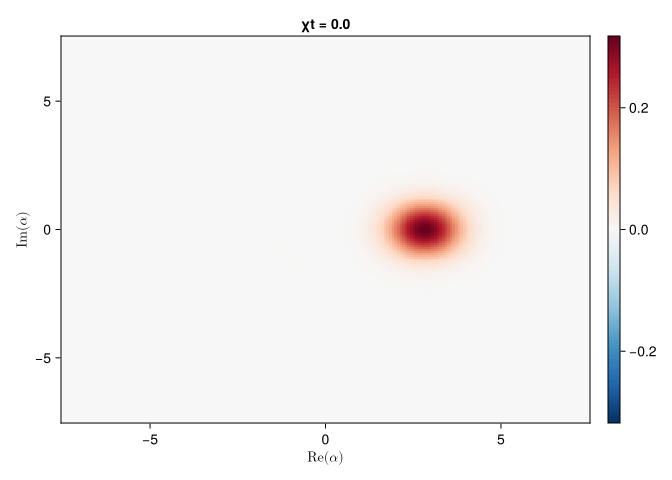

As the animation progresses, you can observe how the initial Gaussian
distribution, typical of a coherent state, is gradually deformed by the
nonlinear interaction.

## Version Information

In [1]:
QuantumToolbox.versioninfo()


 QuantumToolbox.jl: Quantum Toolbox in Julia
≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡≡
Copyright © QuTiP team 2022 and later.
Current admin team:
    Alberto Mercurio and Yi-Te Huang

Package information:
Julia              Ver. 1.11.5
QuantumToolbox     Ver. 0.31.1
SciMLOperators     Ver. 0.3.13
LinearSolve        Ver. 3.12.0
OrdinaryDiffEqCore Ver. 1.25.0

System information:
OS       : macOS (arm64-apple-darwin24.0.0)
CPU      : 8 × Apple M3
Memory   : 16.0 GB
WORD_SIZE: 64
LIBM     : libopenlibm
LLVM     : libLLVM-16.0.6 (ORCJIT, apple-m2)
BLAS     : libopenblas64_.dylib (ilp64)
Threads  : 4 (on 4 virtual cores)
